# **Install requirements**

In [1]:
import sys, os, distutils.core
from IPython.display import clear_output

!python -m pip install pyyaml==5.1
!git clone 'https://github.com/facebookresearch/detectron2'
dist = distutils.core.run_setup("./detectron2/setup.py")
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2'))
clear_output()

# **Install Libraries**

In [2]:
import torch , detectron2
from detectron2.utils.logger import setup_logger
print("detectron2 version:", detectron2.__version__)

setup_logger()
import numpy as np
import os,json , cv2, random
import PIL
import matplotlib.pyplot as plt

from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor ,DefaultTrainer
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

SEED = 99
THRESHOLD = 0.6

detectron2 version: 0.6


In [3]:
from detectron2.data.datasets import register_coco_instances
from detectron2.structures import BoxMode
for i in["train","valid","test"]:
      register_coco_instances(
                                f"brain_tumor_{i}", 
                                {},
                                f"../input/brain-tumor-image-dataset-semantic-segmentation/{i}/_annotations.coco.json",
                                f"../input/brain-tumor-image-dataset-semantic-segmentation/{i}"
                              )

# Dataset Overview


In [4]:
my_dataset_train_metadata = MetadataCatalog.get("brain_tumor_train")
train_dataset_dicts = DatasetCatalog.get("brain_tumor_train")
def create_random_images(dataset_dict ,dataset_metadata ,seed , image_scale = 0.7):

    np.random.seed(seed)
    images = np.random.permutation(dataset_dict)[:2]
    fig ,axs = plt.subplots(1,2 , figsize = (12,6) , dpi =100)
    for i in range(2):
        image = images[i]
        image_link = image["file_name"]
        image_id = image["image_id"]
        img  = cv2.imread(image_link)
        img = cv2.cvtColor(img , cv2.COLOR_BGR2RGB)
        visualizer  = Visualizer(img, metadata= dataset_metadata, scale=image_scale)
        visualizer  = visualizer.draw_dataset_dict(image)
        final_image = visualizer.get_image()
        
        axs[i].set_title('image id: ' + str(image_id), fontsize = 10)
        axs[i].axis('off')
        axs[i].imshow(final_image)

WARNING [01/30 20:00:39 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[01/30 20:00:39 d2.data.datasets.coco]: Loaded 1502 images in COCO format from ../input/brain-tumor-image-dataset-semantic-segmentation/train/_annotations.coco.json


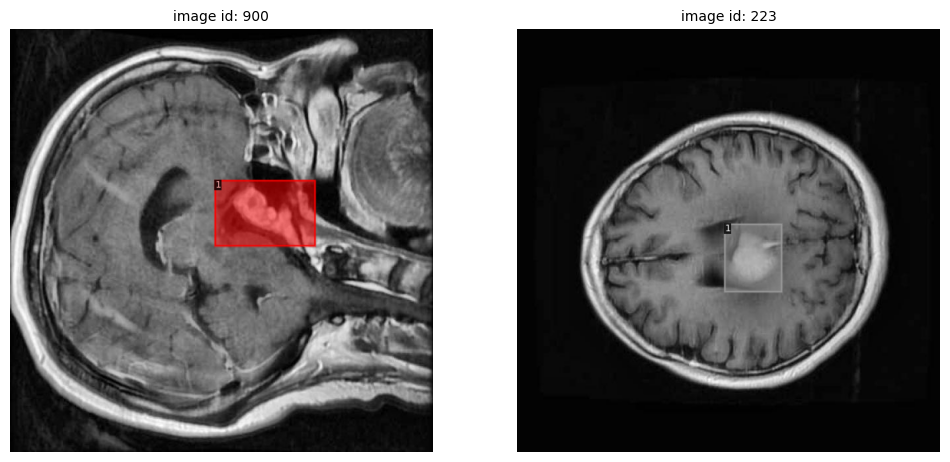

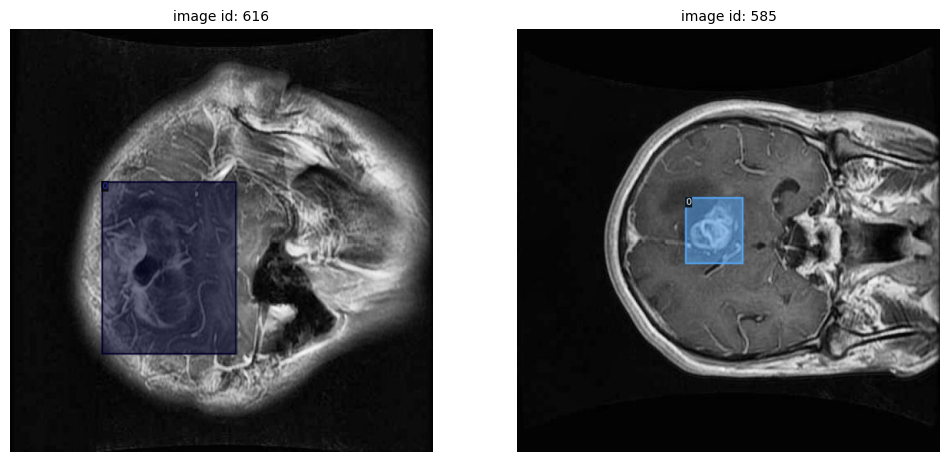

In [5]:
create_random_images(train_dataset_dicts, my_dataset_train_metadata, seed = 95, image_scale = 1)
create_random_images(train_dataset_dicts, my_dataset_train_metadata, seed = 99, image_scale = 1)

In [6]:
EPOCHS = 3300
NUM_CLASSES = 3
BASE_LR = 0.0001


# Model Training

In [7]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("brain_tumor_train")
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_X_101_32x8d_FPN_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = BASE_LR  
cfg.SOLVER.MAX_ITER = EPOCHS    
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512  
cfg.MODEL.ROI_HEADS.NUM_CLASSES = NUM_CLASSES

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

# uncomment below to train
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[01/30 20:00:42 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_2d9806.pkl: 431MB [00:17, 25.1MB/s]                               


[01/30 20:01:00 d2.engine.train_loop]: Starting training from iteration 0


/opt/conda/lib/python3.10/site-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /usr/local/src/pytorch/aten/src/ATen/native/TensorShape.cpp:3526.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[01/30 20:01:18 d2.utils.events]:  eta: 0:43:21  iter: 19  total_loss: 2.088  loss_cls: 1.215  loss_box_reg: 0.06825  loss_mask: 0.6961  loss_rpn_cls: 0.1062  loss_rpn_loc: 0.00672    time: 0.7482  last_time: 0.8333  data_time: 0.0114  last_data_time: 0.0051   lr: 1.9981e-06  max_mem: 3933M


2024-01-30 20:01:20.489785: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-01-30 20:01:20.489884: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-01-30 20:01:20.610506: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


[01/30 20:01:44 d2.utils.events]:  eta: 0:43:17  iter: 39  total_loss: 2.003  loss_cls: 1.14  loss_box_reg: 0.07762  loss_mask: 0.6943  loss_rpn_cls: 0.07186  loss_rpn_loc: 0.006363    time: 0.7626  last_time: 0.8292  data_time: 0.0050  last_data_time: 0.0048   lr: 3.9961e-06  max_mem: 3960M
[01/30 20:02:00 d2.utils.events]:  eta: 0:42:54  iter: 59  total_loss: 1.857  loss_cls: 0.9988  loss_box_reg: 0.0677  loss_mask: 0.691  loss_rpn_cls: 0.09382  loss_rpn_loc: 0.006453    time: 0.7675  last_time: 0.8013  data_time: 0.0050  last_data_time: 0.0047   lr: 5.9941e-06  max_mem: 3968M
[01/30 20:02:15 d2.utils.events]:  eta: 0:42:41  iter: 79  total_loss: 1.641  loss_cls: 0.8109  loss_box_reg: 0.08729  loss_mask: 0.6853  loss_rpn_cls: 0.04504  loss_rpn_loc: 0.00516    time: 0.7684  last_time: 0.8406  data_time: 0.0051  last_data_time: 0.0049   lr: 7.9921e-06  max_mem: 3968M
[01/30 20:02:30 d2.utils.events]:  eta: 0:42:18  iter: 99  total_loss: 1.44  loss_cls: 0.5999  loss_box_reg: 0.06879  lo

In [8]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = THRESHOLD
predictor = DefaultPredictor(cfg)

import pickle
with open("cfg.pkl", "wb") as f:
    pickle.dump(cfg, f)

[01/30 20:46:04 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


In [9]:
def reading_metrics_from_json(metrics_path):
    metrics = []
    with open(metrics_path, 'r') as f:
        for line in f:
            metrics.append(json.loads(line))
    return metrics


def metric(metrics, specific_metric):
    metric = []
    for i in range(len(metrics)):
        try: 
            metric.append(metrics[i][specific_metric])
        except KeyError:
            pass
    return metric

# Model Performance


In [10]:
train_metrics = reading_metrics_from_json('/kaggle/working/output/metrics.json')

iters = metric(train_metrics, 'iteration')
total_loss = metric(train_metrics, 'total_loss')
cls_acc = metric(train_metrics, 'fast_rcnn/cls_accuracy')
loss_mask = metric(train_metrics, 'loss_mask')
loss_box_reg = metric(train_metrics, 'loss_box_reg')


# checking metric lengths
if len(iters) == len(total_loss) == len(cls_acc) == len(loss_mask) == len(loss_box_reg):
    pass
else:
    iters = iters[:-1]

Text(0.5, 1.0, 'Mask Loss')

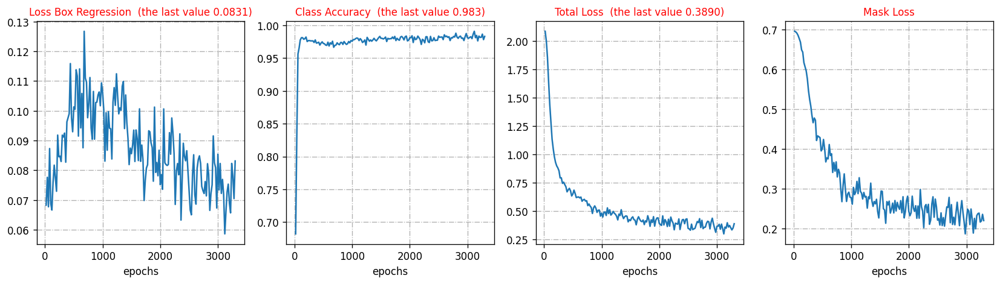

In [11]:
fig, axs = plt.subplots(1,4, figsize = (17, 4), dpi = 120)


axs[0].grid(linestyle = 'dashdot')
axs[0].plot(iters, loss_box_reg)
axs[0].set_xlabel('epochs', fontsize = 10)
axs[0].set_title('Loss Box Regression', fontsize = 10)
tit0 = ' (the last value {0:.4f})'.format(loss_box_reg[-1])
axs[0].set_title('Loss Box Regression ' + tit0, fontsize = 10, color = 'red')

axs[1].grid(linestyle = 'dashdot')
axs[1].plot(iters, cls_acc)
axs[1].set_xlabel('epochs', fontsize = 10)
tit1 = ' (the last value {0:.3f})'.format(cls_acc[-1])
axs[1].set_title('Class Accuracy ' + tit1, fontsize = 10, color = 'red')

axs[2].grid(linestyle = 'dashdot')
axs[2].plot(iters, total_loss)
axs[2].set_xlabel('epochs', fontsize = 10)
tit2 = ' (the last value {0:.4f})'.format(total_loss[-1])
axs[2].set_title('Total Loss ' + tit2, fontsize = 10, color = 'red')

axs[3].grid(linestyle = 'dashdot')
axs[3].plot(iters, loss_mask)
axs[3].set_xlabel('epochs', fontsize = 10)
axs[3].set_title('Mask Loss', fontsize = 10, color = 'red')

# Training the vaild Images

In [12]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("brain_tumor_valid", False, output_dir="./output/")
test_loader = build_detection_test_loader(cfg, "brain_tumor_valid")
inference_on_dataset(trainer.model, test_loader, evaluator)

[01/30 20:48:13 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
WARNING [01/30 20:48:13 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[01/30 20:48:13 d2.data.datasets.coco]: Loaded 429 images in COCO format from ../input/brain-tumor-image-dataset-semantic-segmentation/valid/_annotations.coco.json
[01/30 20:48:13 d2.data.build]: Distribution of instances among all 3 categories:
|  category  | #instances   | category   | #instances   | category   | #instances   |
|:----------:|:-------------|:-----------|:-------------|:-----------|:-------------|
|   Tumor    | 0            | 0          | 210          | 1          | 219          |
|            |              |            |              |            |              |
|   total    | 429          |            |              |            |              |
[01/30 20:48:13 d2.data.dataset_mapper]: [DatasetMapper] Augmentations us

OrderedDict([('bbox',
              {'AP': 42.0803830645943,
               'AP50': 77.64897243091883,
               'AP75': 42.35818442779889,
               'APs': nan,
               'APm': 35.204497046344464,
               'APl': 46.04343065675383,
               'AP-Tumor': nan,
               'AP-0': 30.51168960434133,
               'AP-1': 53.64907652484726}),
             ('segm',
              {'AP': 40.991367525703744,
               'AP50': 77.99515116948356,
               'AP75': 41.01874601914102,
               'APs': nan,
               'APm': 34.81935151095483,
               'APl': 44.272544371680446,
               'AP-Tumor': nan,
               'AP-0': 29.976517680954927,
               'AP-1': 52.00621737045255})])

# Making Predictions on vaild Images

In [13]:
my_dataset_test_metadata = MetadataCatalog.get("brain_tumor_valid")
from detectron2.utils.visualizer import ColorMode
dataset_dicts = DatasetCatalog.get("brain_tumor_valid")


# A function for plotting an original image's bbox and predicted bbox
def create_predictions(dataset_dict, dataset_metadata, seed, image_scale = 0.8):
    np.random.seed(seed=seed)
    images = np.random.permutation(dataset_dict)[:3]
    
    fig, axs = plt.subplots(3,2, figsize = (20,20), dpi = 120)
    
    for i in range(3):
        im = images[i]
        img_link = im['file_name']
        img_id = im['image_id']
        img = cv2.imread(img_link)
        img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
        visualizer1 = Visualizer(img, metadata= dataset_metadata, scale=image_scale)

        vis_original = visualizer1.draw_dataset_dict(im)
        original_bbox = vis_original.get_image()
        
        visualizer2 = Visualizer(img[:, :, ::-1], metadata= dataset_metadata, scale=image_scale, instance_mode=ColorMode.IMAGE_BW)
        outputs = predictor(img)
        out = visualizer2.draw_instance_predictions(outputs["instances"].to("cpu"))
        out_img = cv2.cvtColor(out.get_image(), cv2.COLOR_BGR2RGB)
        final_bbox = cv2.cvtColor(out_img, cv2.COLOR_BGR2RGB)
        
        axs[i][0].set_title('original bbox (id: ' + str(img_id) +')', fontsize = 20)
        axs[i][0].axis('off')
        axs[i][0].imshow(original_bbox)
        
        axs[i][1].set_title('predicted bbox (id: ' + str(img_id) +')', fontsize = 20, color = 'red')
        axs[i][1].axis('off')
        axs[i][1].imshow(final_bbox[:, :, ::-1])
        
    fig.tight_layout()

WARNING [01/30 20:50:15 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[01/30 20:50:15 d2.data.datasets.coco]: Loaded 429 images in COCO format from ../input/brain-tumor-image-dataset-semantic-segmentation/valid/_annotations.coco.json


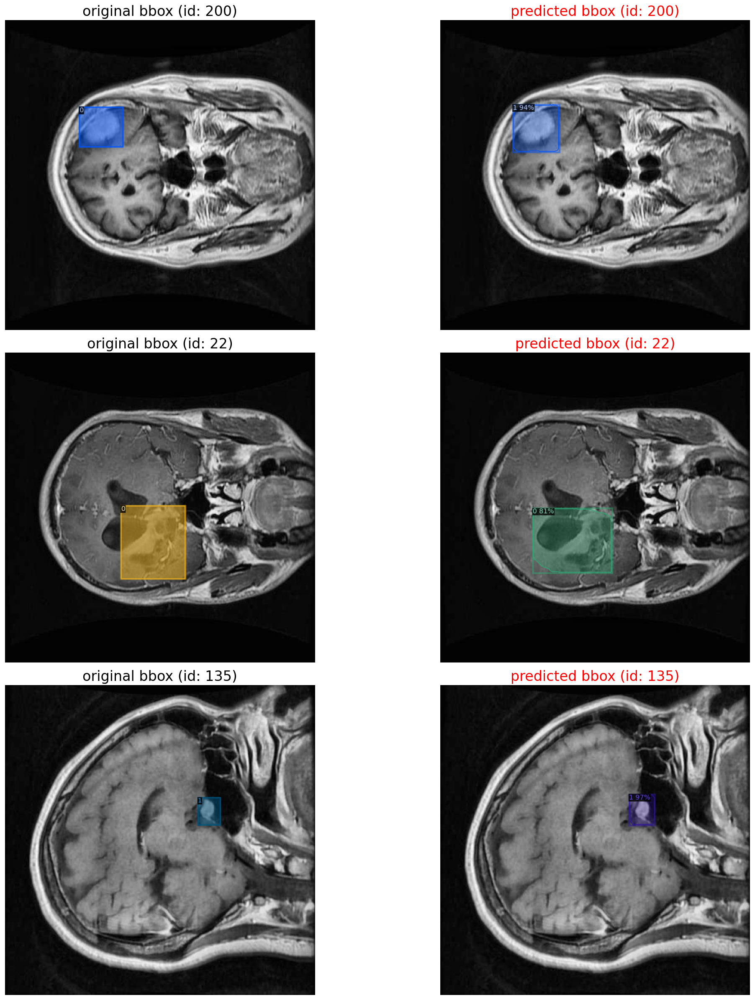

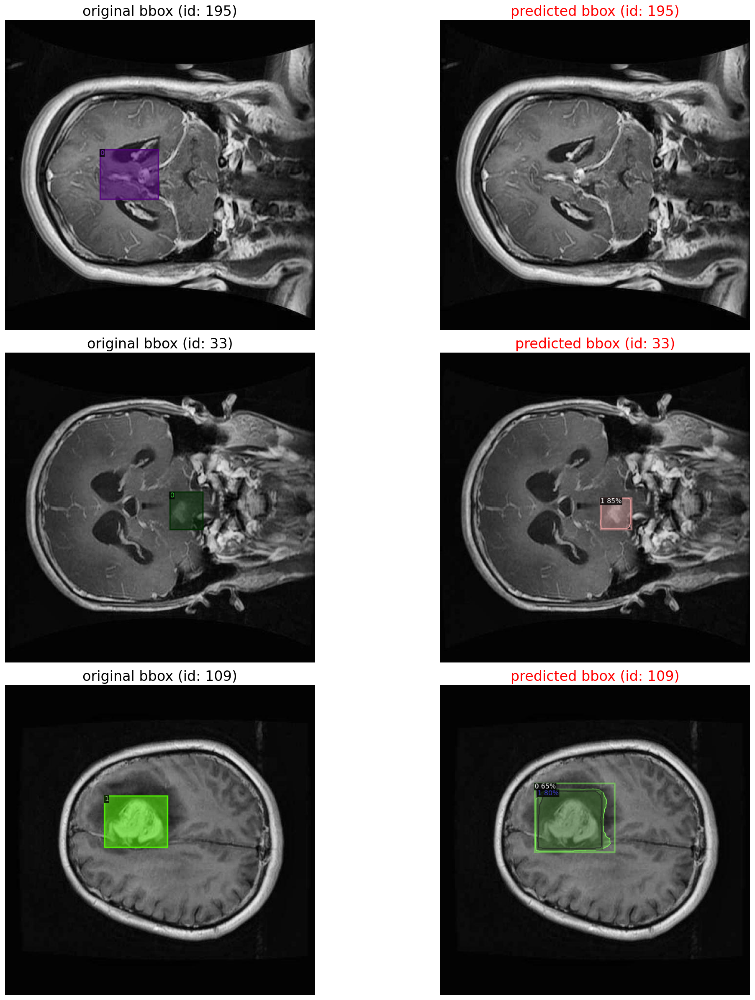

In [14]:
create_predictions(dataset_dicts,my_dataset_test_metadata, seed = 421, image_scale = 1)
create_predictions(dataset_dicts,my_dataset_test_metadata, seed = 83, image_scale = 1)

# Training the vaild Images

In [15]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("brain_tumor_test", False, output_dir="./output/")
test_loader = build_detection_test_loader(cfg, "brain_tumor_test")
inference_on_dataset(trainer.model, test_loader, evaluator)


my_dataset_test_metadata = MetadataCatalog.get("brain_tumor_test")
from detectron2.utils.visualizer import ColorMode
dataset_dicts = DatasetCatalog.get("brain_tumor_test")

[01/30 20:51:07 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
WARNING [01/30 20:51:07 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[01/30 20:51:07 d2.data.datasets.coco]: Loaded 215 images in COCO format from ../input/brain-tumor-image-dataset-semantic-segmentation/test/_annotations.coco.json
[01/30 20:51:07 d2.data.build]: Distribution of instances among all 3 categories:
|  category  | #instances   | category   | #instances   | category   | #instances   |
|:----------:|:-------------|:-----------|:-------------|:-----------|:-------------|
|   Tumor    | 0            | 0          | 118          | 1          | 97           |
|            |              |            |              |            |              |
|   total    | 215          |            |              |            |              |
[01/30 20:51:07 d2.data.dataset_mapper]: [DatasetMapper] Augmentations use

# Making Predictions on vaild Images

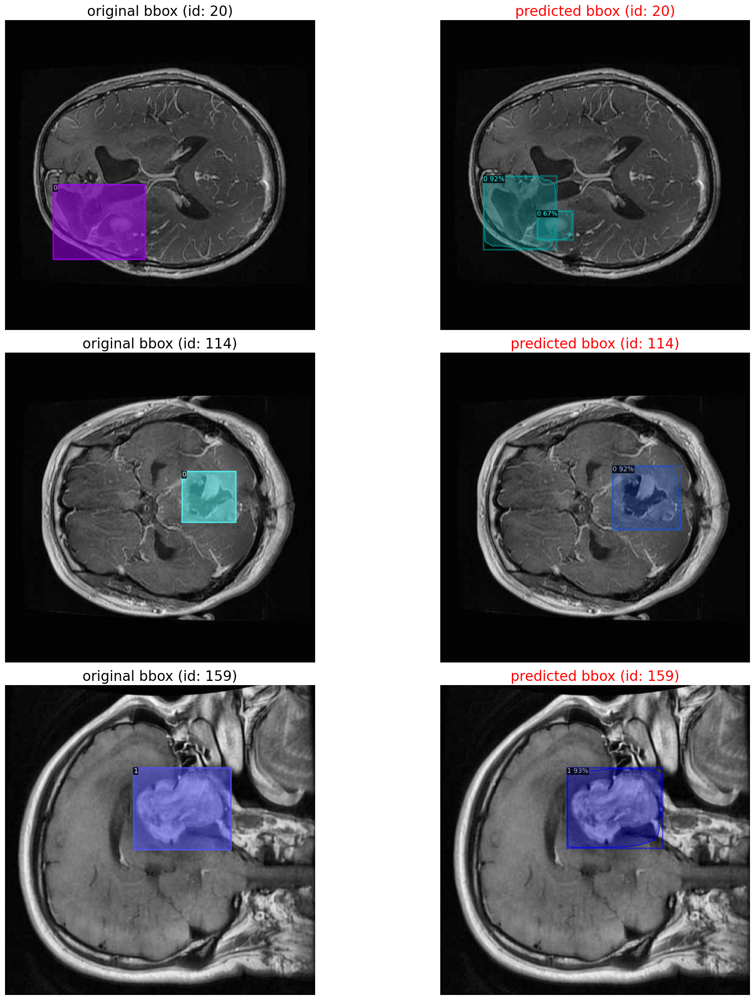

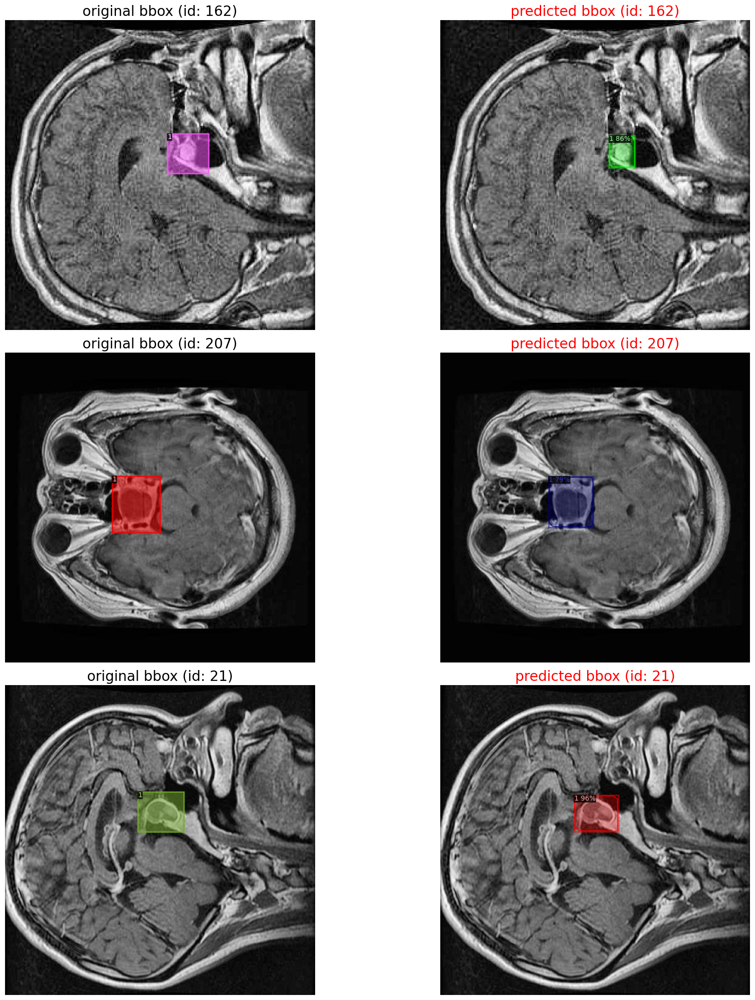

In [16]:
create_predictions(dataset_dicts,my_dataset_test_metadata, seed = 154, image_scale = 1)
create_predictions(dataset_dicts,my_dataset_test_metadata, seed = 51, image_scale = 1)
